<a href="https://colab.research.google.com/github/0x1AY/Parking-Lot-Occupancy-Estimation-/blob/main/train_multiclass.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## 1. Environment Setup


In [2]:
%pip install -q ultralytics opencv-python matplotlib pyyaml


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 74.9 MB/s eta 0:00:00


In [3]:
# Import libraries
import os
import torch
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt
import yaml
from pathlib import Path

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
    print(f"CUDA memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
PyTorch version: 2.8.0+cu126
CUDA available: True
CUDA device: Tesla T4
CUDA memory: 15.83 GB


## 2. Dataset Configuration


In [5]:
# Dataset paths
DATASET_NAME = "/content/drive/MyDrive/parkinglots/Dataset-V1-multiclass"
DATASET_ROOT = os.path.join(os.getcwd(), DATASET_NAME)

# For Google Colab, use environment variable if set
if os.getenv('DATASET_ROOT'):
    DATASET_ROOT = os.getenv('DATASET_ROOT')
    print(f"Using DATASET_ROOT from environment: {DATASET_ROOT}")
else:
    print(f"Using local DATASET_ROOT: {DATASET_ROOT}")

DATA_YAML = os.path.join(DATASET_ROOT, "data.yaml")

# Verify dataset exists
if os.path.exists(DATA_YAML):
    print(f"✅ Dataset found: {DATA_YAML}")
    with open(DATA_YAML, 'r') as f:
        data_config = yaml.safe_load(f)
    print(f"Classes: {data_config['names']}")
    print(f"Number of classes: {data_config['nc']}")
else:
    print(f"❌ Dataset not found at: {DATA_YAML}")
    print("Please run tools/create_multiclass_dataset.py first")

Using local DATASET_ROOT: /content/drive/MyDrive/parkinglots/Dataset-V1-multiclass
✅ Dataset found: /content/drive/MyDrive/parkinglots/Dataset-V1-multiclass/data.yaml
Classes: {0: 'car', 1: 'lot_boundary', 2: 'objects', 3: 'stall'}
Number of classes: 4


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 3. Verify Dataset Statistics


In [6]:
# Count images in each split
splits = ['train', 'valid', 'test']
dataset_stats = {}

for split in splits:
    images_dir = os.path.join(DATASET_ROOT, split, 'images')
    labels_dir = os.path.join(DATASET_ROOT, split, 'labels')

    if os.path.exists(images_dir):
        num_images = len([f for f in os.listdir(images_dir) if f.endswith('.jpg')])
        num_labels = len([f for f in os.listdir(labels_dir) if f.endswith('.txt')])
        dataset_stats[split] = {'images': num_images, 'labels': num_labels}
    else:
        dataset_stats[split] = {'images': 0, 'labels': 0}

print("\n📊 Dataset Statistics:")
print("="*50)
for split, stats in dataset_stats.items():
    print(f"{split.capitalize():8s}: {stats['images']:3d} images, {stats['labels']:3d} labels")
print("="*50)
total_images = sum(s['images'] for s in dataset_stats.values())
print(f"Total:     {total_images:3d} images")


📊 Dataset Statistics:
Train   : 148 images, 148 labels
Valid   :  18 images,  18 labels
Test    :   7 images,   7 labels
Total:     173 images


## 4. Visualize Sample Annotations


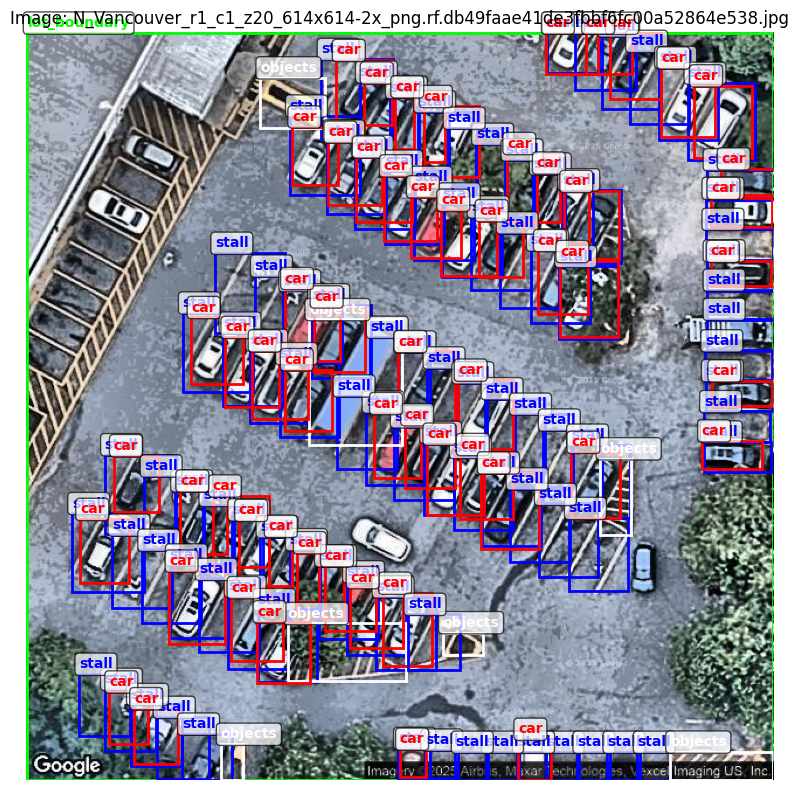

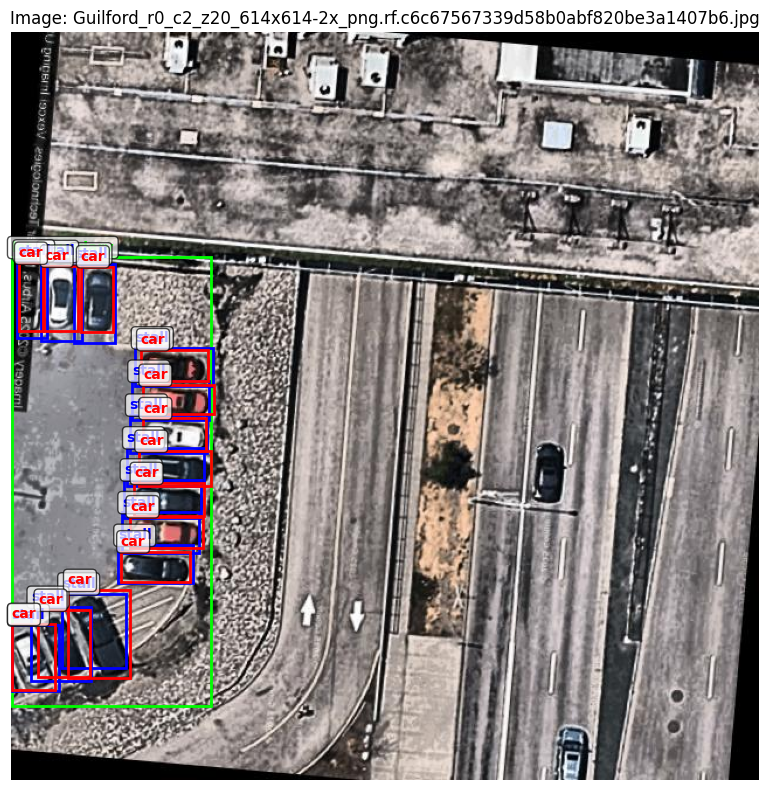

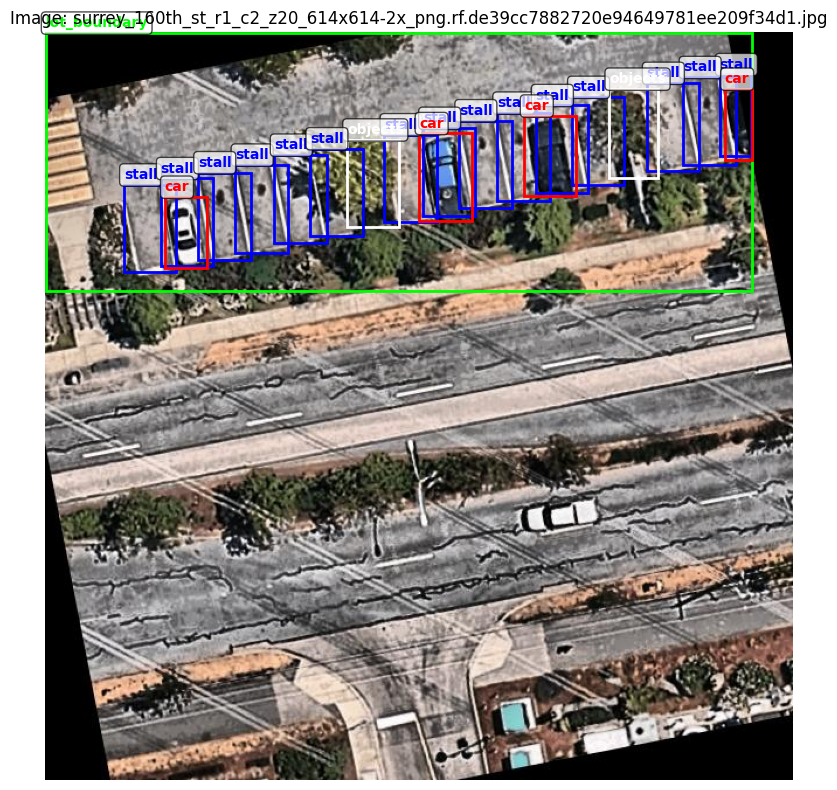

In [7]:
def visualize_annotations(image_path, label_path, class_names):
    """
    Visualize YOLO format annotations on image using matplotlib.

    Args:
        image_path: Path to image file
        label_path: Path to YOLO format label file
        class_names: Dictionary mapping class IDs to names
    """
    # Read image
    img = cv2.imread(str(image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    # Create figure
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    # Color map for classes
    colors = {
        0: '#FF0000',  # car - red
        1: '#00FF00',  # lot_boundary - green
        3: '#0000FF',  # stall - blue
    }

    # Read and draw annotations
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    x_center, y_center, bbox_w, bbox_h = map(float, parts[1:5])

                    # Convert YOLO format to pixel coordinates
                    x_center_px = x_center * w
                    y_center_px = y_center * h
                    bbox_w_px = bbox_w * w
                    bbox_h_px = bbox_h * h

                    # Calculate corner coordinates
                    x1 = x_center_px - bbox_w_px / 2
                    y1 = y_center_px - bbox_h_px / 2

                    # Draw rectangle
                    color = colors.get(class_id, '#FFFFFF')
                    rect = plt.Rectangle((x1, y1), bbox_w_px, bbox_h_px,
                                        fill=False, edgecolor=color, linewidth=2)
                    ax.add_patch(rect)

                    # Add label
                    class_name = class_names.get(class_id, f'class_{class_id}')
                    ax.text(x1, y1 - 5, class_name,
                           color=color, fontsize=10, weight='bold',
                           bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

    ax.axis('off')
    plt.title(f"Image: {os.path.basename(image_path)}")
    plt.tight_layout()
    plt.show()


# Visualize a sample from train set
train_images = Path(DATASET_ROOT) / 'train' / 'images'
train_labels = Path(DATASET_ROOT) / 'train' / 'labels'

sample_images = list(train_images.glob('*.jpg'))[:3]  # First 3 images

for img_path in sample_images:
    label_path = train_labels / (img_path.stem + '.txt')
    visualize_annotations(img_path, label_path, data_config['names'])

## 5. Training Configuration

Multi-class training with all classes enabled


In [8]:
# Training configuration
config = {
    # Model
    'model': 'yolo11m.pt',  # YOLOv11 medium pretrained

    # Training parameters
    'epochs': 100,
    'batch': 16,
    'imgsz': 640,
    'patience': 20,  # Early stopping
    'workers': 8,
    'device': 0,  # GPU 0, use 'cpu' for CPU training

    # Optimizer
    'optimizer': 'AdamW',
    'lr0': 0.00125,  # Initial learning rate
    'lrf': 0.01,     # Final learning rate factor
    'momentum': 0.937,
    'weight_decay': 0.0005,

    # Data augmentation
    'hsv_h': 0.015,  # HSV-Hue augmentation
    'hsv_s': 0.7,    # HSV-Saturation augmentation
    'hsv_v': 0.4,    # HSV-Value augmentation
    'degrees': 10.0,  # Rotation degrees
    'translate': 0.1,  # Translation
    'scale': 0.5,     # Scaling
    'shear': 0.0,     # Shear
    'perspective': 0.0,  # Perspective
    'flipud': 0.0,    # Flip up-down
    'fliplr': 0.5,    # Flip left-right
    'mosaic': 1.0,    # Mosaic augmentation
    'mixup': 0.0,     # Mixup augmentation

    # Output
    'project': 'parking_runs',
    'name': 'yolo11m_multiclass',
    'exist_ok': True,
    'save': True,
    'save_period': 10,  # Save checkpoint every 10 epochs
}

print("Training Configuration:")
print("="*60)
for key, value in config.items():
    print(f"{key:20s}: {value}")
print("="*60)

Training Configuration:
model               : yolo11m.pt
epochs              : 100
batch               : 16
imgsz               : 640
patience            : 20
workers             : 8
device              : 0
optimizer           : AdamW
lr0                 : 0.00125
lrf                 : 0.01
momentum            : 0.937
weight_decay        : 0.0005
hsv_h               : 0.015
hsv_s               : 0.7
hsv_v               : 0.4
degrees             : 10.0
translate           : 0.1
scale               : 0.5
shear               : 0.0
perspective         : 0.0
flipud              : 0.0
fliplr              : 0.5
mosaic              : 1.0
mixup               : 0.0
project             : parking_runs
name                : yolo11m_multiclass
exist_ok            : True
save                : True
save_period         : 10


## 6. Train Multi-Class Model

Training on car (0), lot_boundary (1), and stall (3) classes


In [10]:
# Load model
model = YOLO(config['model'])

# --- Start of suggested fix for data.yaml path issue ---
# The original data.yaml uses 'path: .' which Ultralytics interprets incorrectly
# when the yaml file is in Google Drive. It looks for /content/valid/images instead of
# /content/drive/MyDrive/parkinglots/Dataset-V1-multiclass/valid/images.

# Create a temporary data.yaml with the correct absolute path
temp_data_yaml_path = "/content/temp_data.yaml"

# Re-read the original data_config to ensure it's fresh and modify it
with open(DATA_YAML, 'r') as f:
    current_data_config = yaml.safe_load(f)

current_data_config['path'] = DATASET_ROOT # Set the absolute path

with open(temp_data_yaml_path, 'w') as f:
    yaml.safe_dump(current_data_config, f)

print(f"Updated data.yaml created at: {temp_data_yaml_path}")
print(f"New data.yaml content:")
print(yaml.safe_dump(current_data_config))
# --- End of suggested fix ---

# Train with all configuration parameters, using the temporary data.yaml
results = model.train(
    data=temp_data_yaml_path, # Use the updated DATA_YAML
    epochs=config['epochs'],
    batch=config['batch'],
    imgsz=config['imgsz'],
    patience=config['patience'],
    workers=config['workers'],
    device=config['device'],
    optimizer=config['optimizer'],
    lr0=config['lr0'],
    lrf=config['lrf'],
    momentum=config['momentum'],
    weight_decay=config['weight_decay'],
    hsv_h=config['hsv_h'],
    hsv_s=config['hsv_s'],
    hsv_v=config['hsv_v'],
    degrees=config['degrees'],
    translate=config['translate'],
    scale=config['scale'],
    shear=config['shear'],
    perspective=config['perspective'],
    flipud=config['flipud'],
    fliplr=config['fliplr'],
    mosaic=config['mosaic'],
    mixup=config['mixup'],
    project=config['project'],
    name=config['name'],
    exist_ok=config['exist_ok'],
    save=config['save'],
    save_period=config['save_period'],
)

print("\n✅ Training completed!")
print(f"Best model saved at: {results.save_dir}/weights/best.pt")

Updated data.yaml created at: /content/temp_data.yaml
New data.yaml content:
names:
  0: car
  1: lot_boundary
  2: objects
  3: stall
nc: 4
path: /content/drive/MyDrive/parkinglots/Dataset-V1-multiclass
test: test/images
train: train/images
val: valid/images

Ultralytics 8.3.229 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/temp_data.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.00125, lrf=0.01, m

## 7. Visualize Training Results


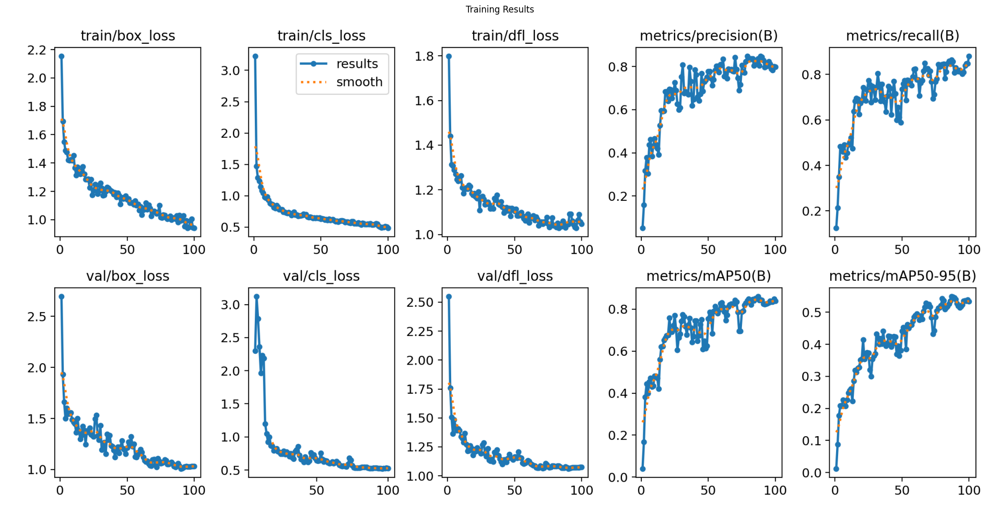

In [11]:
# Display results plot
results_img = plt.imread(f"{config['project']}/{config['name']}/results.png")
plt.figure(figsize=(20, 10))
plt.imshow(results_img)
plt.axis('off')
plt.title('Training Results')
plt.tight_layout()
plt.show()

## 8. Load Best Model for Inference


In [12]:
# Load best model
best_model_path = f"{config['project']}/{config['name']}/weights/best.pt"
model_best = YOLO(best_model_path)

print(f"✅ Loaded best model from: {best_model_path}")

✅ Loaded best model from: parking_runs/yolo11m_multiclass/weights/best.pt


## 9. Validation Metrics


In [15]:
# Run validation
metrics = model_best.val(data=temp_data_yaml_path)

print("\n📊 Validation Metrics:")
print("="*60)
print(f"mAP50:     {metrics.box.map50:.4f}")
print(f"mAP50-95:  {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall:    {metrics.box.mr:.4f}")
print("\nPer-class mAP50:")
for i, (class_name, map50) in enumerate(zip(data_config['names'].values(), metrics.box.maps)):
    print(f"  {class_name:15s}: {map50:.4f}")
print("="*60)

Ultralytics 8.3.229 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.7±0.3 ms, read: 64.5±14.0 MB/s, size: 115.3 KB)
val: Scanning /content/drive/MyDrive/parkinglots/Dataset-V1-multiclass/valid/labels.cache... 18 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 18/18 35.0Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.3it/s 1.6s
                   all         18       2101      0.838      0.863      0.862      0.549
                   car         18        554      0.967      0.953       0.98      0.635
          lot_boundary         18         19      0.781      0.947      0.938      0.526
               objects         17         66      0.656      0.606      0.562      0.302
                 stall         18       1462      0.949      0.947      0.966      0.733
Speed: 15.2ms preprocess, 36.7ms inference, 0.0ms loss, 2.7ms postprocess per image
Results save

## 10. Confusion Matrix


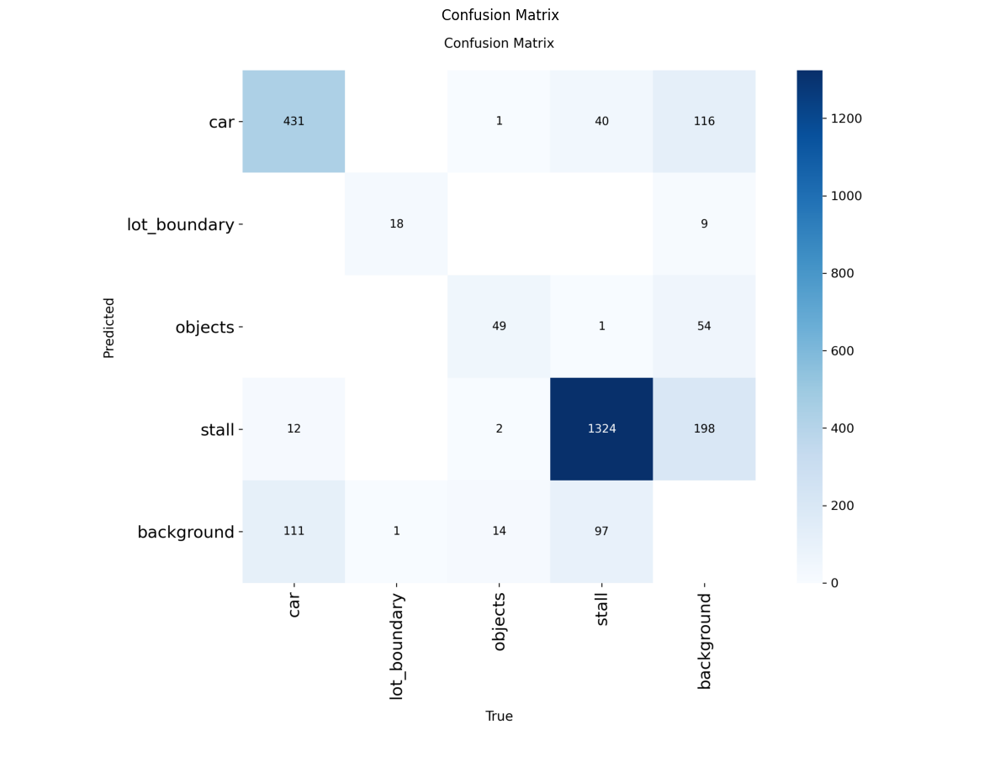

In [14]:
# Display confusion matrix
cm_img = plt.imread(f"{config['project']}/{config['name']}/confusion_matrix.png")
plt.figure(figsize=(12, 10))
plt.imshow(cm_img)
plt.axis('off')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

## 11. Test Predictions on Sample Images



image 1/1 /content/drive/MyDrive/parkinglots/Dataset-V1-multiclass/test/images/surrey_160th_st_r1_c1_z20_614x614-2x_png.rf.f0fbab751d2bf3724a3bc828b7f77633.jpg: 640x640 30 cars, 3 lot_boundarys, 11 objectss, 85 stalls, 36.9ms
Speed: 4.0ms preprocess, 36.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


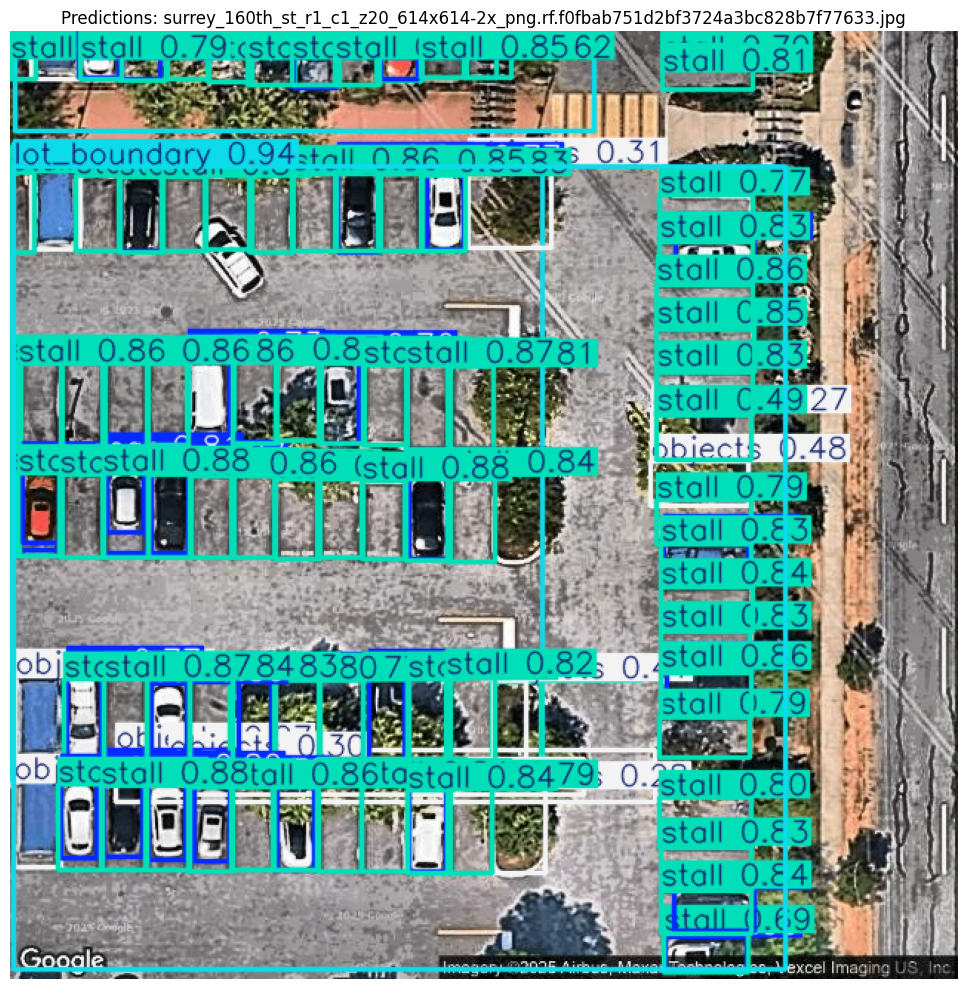


Detections in surrey_160th_st_r1_c1_z20_614x614-2x_png.rf.f0fbab751d2bf3724a3bc828b7f77633.jpg:
  lot_boundary: 0.937
  stall: 0.883
  stall: 0.879
  stall: 0.879
  stall: 0.873
  stall: 0.871
  stall: 0.869
  stall: 0.866
  stall: 0.864
  stall: 0.864
  stall: 0.862
  stall: 0.862
  stall: 0.861
  stall: 0.861
  stall: 0.861
  stall: 0.860
  stall: 0.859
  stall: 0.858
  stall: 0.858
  stall: 0.854
  stall: 0.850
  stall: 0.849
  stall: 0.848
  stall: 0.846
  stall: 0.845
  stall: 0.844
  stall: 0.844
  stall: 0.844
  stall: 0.843
  stall: 0.842
  stall: 0.842
  stall: 0.841
  stall: 0.838
  stall: 0.837
  stall: 0.834
  stall: 0.834
  stall: 0.833
  stall: 0.833
  stall: 0.831
  stall: 0.831
  stall: 0.831
  stall: 0.830
  stall: 0.829
  stall: 0.827
  stall: 0.827
  stall: 0.826
  stall: 0.825
  stall: 0.824
  stall: 0.824
  stall: 0.824
  stall: 0.820
  stall: 0.818
  car: 0.815
  stall: 0.814
  car: 0.814
  car: 0.810
  stall: 0.808
  stall: 0.808
  car: 0.804
  car: 0.803
  stal

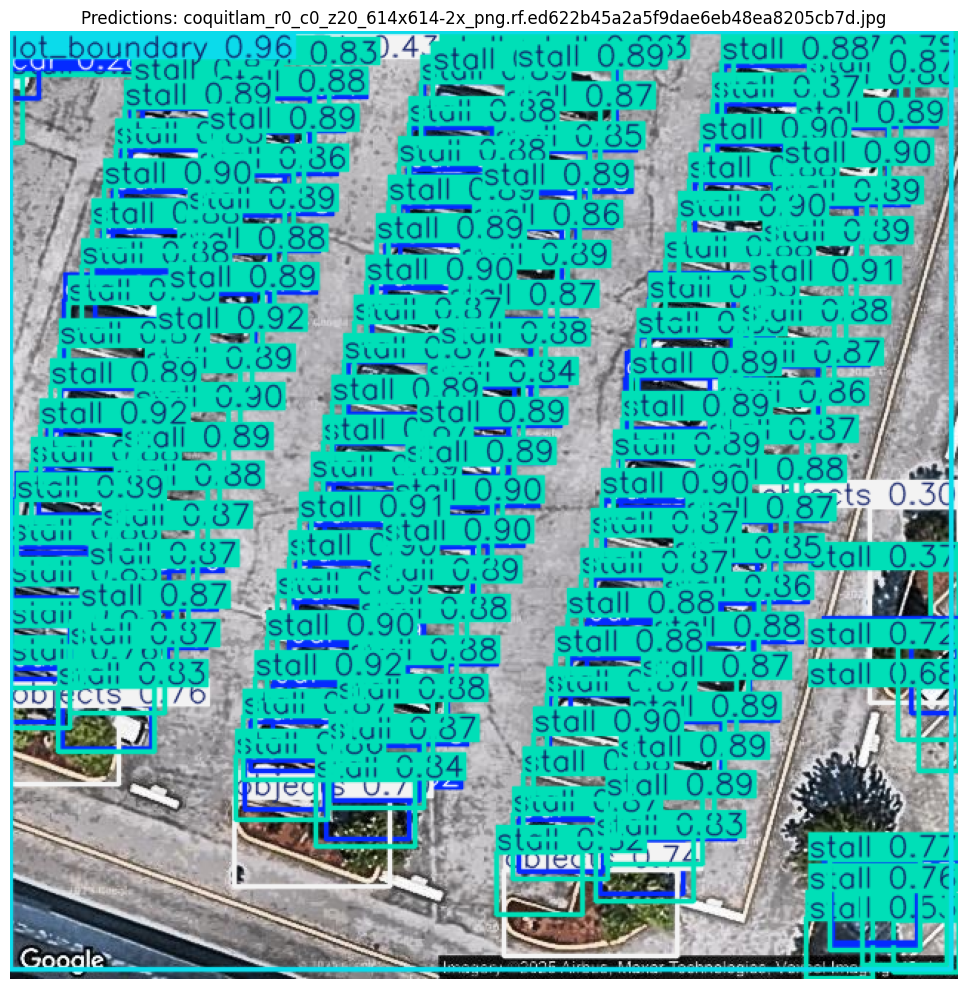


Detections in coquitlam_r0_c0_z20_614x614-2x_png.rf.ed622b45a2a5f9dae6eb48ea8205cb7d.jpg:
  lot_boundary: 0.964
  stall: 0.919
  stall: 0.918
  stall: 0.918
  stall: 0.910
  stall: 0.908
  stall: 0.902
  stall: 0.902
  stall: 0.900
  stall: 0.899
  stall: 0.899
  stall: 0.899
  stall: 0.898
  stall: 0.898
  stall: 0.897
  stall: 0.896
  stall: 0.896
  stall: 0.895
  stall: 0.894
  stall: 0.894
  stall: 0.894
  stall: 0.892
  stall: 0.892
  stall: 0.892
  stall: 0.891
  stall: 0.891
  stall: 0.890
  stall: 0.890
  stall: 0.890
  stall: 0.889
  stall: 0.889
  stall: 0.889
  stall: 0.889
  stall: 0.888
  stall: 0.888
  stall: 0.888
  stall: 0.888
  stall: 0.888
  stall: 0.888
  stall: 0.888
  stall: 0.887
  stall: 0.887
  stall: 0.887
  stall: 0.886
  stall: 0.885
  stall: 0.885
  stall: 0.885
  stall: 0.885
  stall: 0.884
  stall: 0.884
  stall: 0.883
  stall: 0.883
  stall: 0.882
  stall: 0.882
  stall: 0.882
  stall: 0.882
  stall: 0.881
  stall: 0.880
  stall: 0.879
  stall: 0.879
  

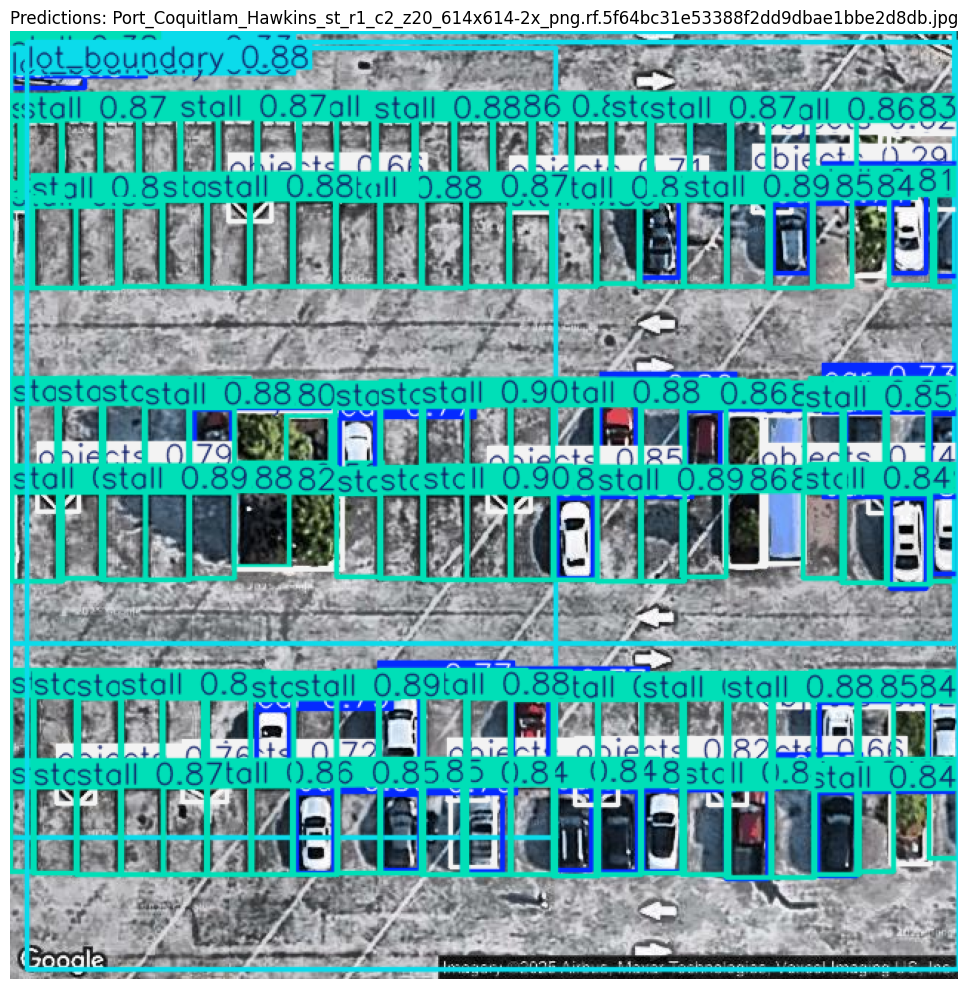


Detections in Port_Coquitlam_Hawkins_st_r1_c2_z20_614x614-2x_png.rf.5f64bc31e53388f2dd9dbae1bbe2d8db.jpg:
  stall: 0.902
  stall: 0.898
  stall: 0.891
  stall: 0.888
  stall: 0.886
  stall: 0.886
  stall: 0.882
  stall: 0.879
  lot_boundary: 0.879
  stall: 0.879
  stall: 0.878
  stall: 0.878
  stall: 0.878
  stall: 0.877
  stall: 0.877
  stall: 0.877
  stall: 0.877
  stall: 0.875
  stall: 0.875
  stall: 0.875
  stall: 0.873
  stall: 0.871
  stall: 0.871
  stall: 0.871
  stall: 0.869
  stall: 0.867
  stall: 0.867
  stall: 0.866
  stall: 0.866
  stall: 0.866
  stall: 0.865
  stall: 0.865
  stall: 0.864
  stall: 0.864
  stall: 0.864
  stall: 0.864
  stall: 0.863
  stall: 0.863
  stall: 0.863
  stall: 0.862
  stall: 0.862
  stall: 0.862
  stall: 0.862
  stall: 0.861
  stall: 0.860
  stall: 0.860
  stall: 0.858
  stall: 0.858
  stall: 0.857
  stall: 0.855
  stall: 0.855
  stall: 0.854
  stall: 0.854
  stall: 0.854
  stall: 0.853
  stall: 0.853
  stall: 0.853
  stall: 0.853
  stall: 0.852
 

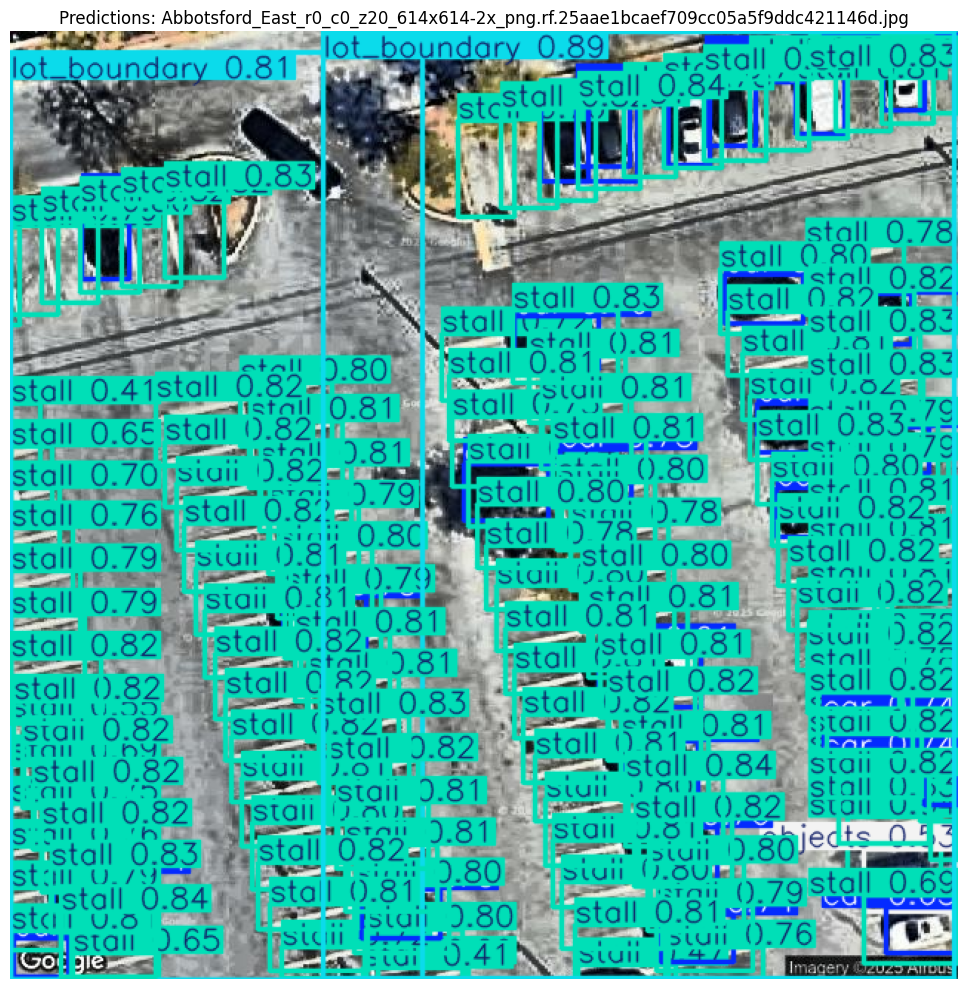


Detections in Abbotsford_East_r0_c0_z20_614x614-2x_png.rf.25aae1bcaef709cc05a5f9ddc421146d.jpg:
  lot_boundary: 0.895
  stall: 0.844
  stall: 0.839
  stall: 0.836
  stall: 0.835
  stall: 0.834
  stall: 0.832
  stall: 0.832
  stall: 0.828
  stall: 0.827
  stall: 0.827
  stall: 0.825
  stall: 0.825
  stall: 0.824
  stall: 0.824
  stall: 0.824
  stall: 0.823
  stall: 0.821
  stall: 0.821
  stall: 0.821
  stall: 0.821
  stall: 0.820
  stall: 0.820
  stall: 0.820
  stall: 0.820
  stall: 0.820
  stall: 0.819
  stall: 0.819
  stall: 0.819
  stall: 0.818
  stall: 0.817
  stall: 0.817
  stall: 0.817
  stall: 0.817
  stall: 0.817
  stall: 0.817
  stall: 0.816
  stall: 0.816
  stall: 0.816
  stall: 0.815
  stall: 0.815
  stall: 0.815
  stall: 0.815
  stall: 0.815
  stall: 0.815
  stall: 0.815
  stall: 0.814
  stall: 0.814
  stall: 0.813
  stall: 0.812
  stall: 0.812
  stall: 0.812
  stall: 0.812
  stall: 0.812
  stall: 0.811
  stall: 0.811
  stall: 0.811
  stall: 0.810
  lot_boundary: 0.810
  st

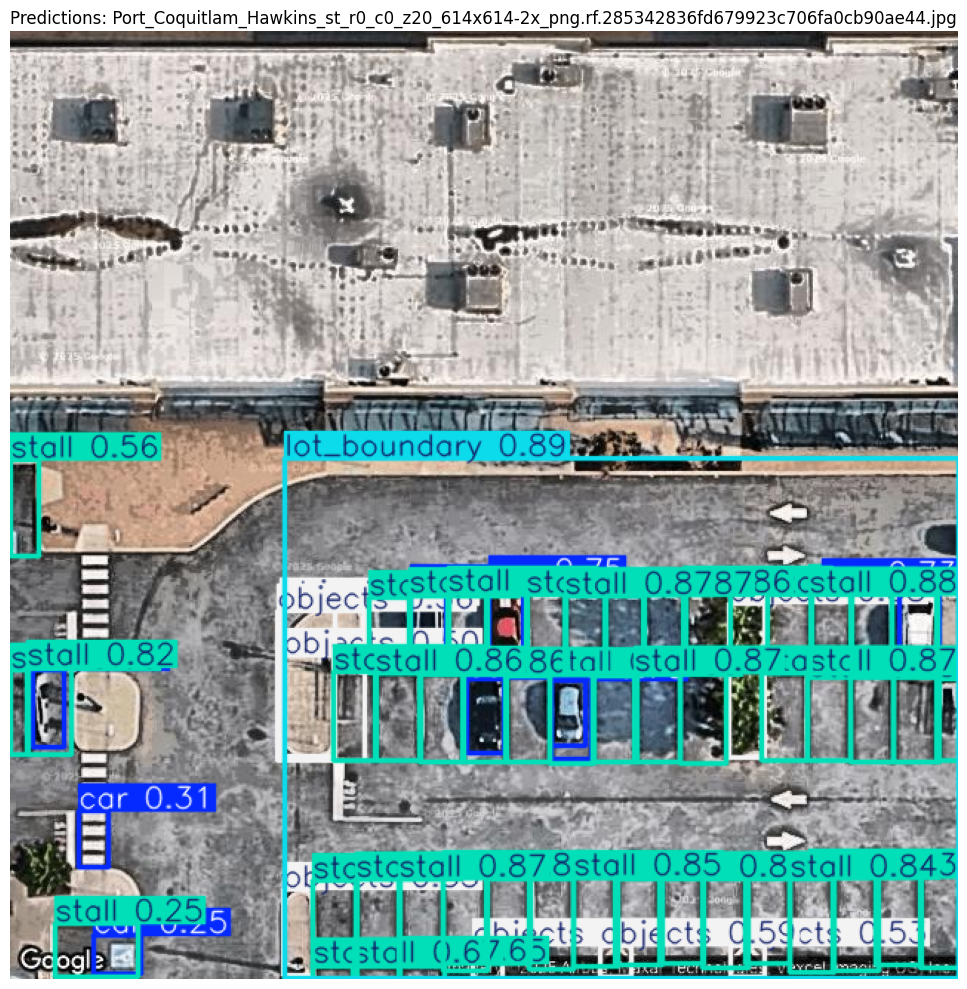


Detections in Port_Coquitlam_Hawkins_st_r0_c0_z20_614x614-2x_png.rf.285342836fd679923c706fa0cb90ae44.jpg:
  lot_boundary: 0.889
  stall: 0.876
  stall: 0.874
  stall: 0.872
  stall: 0.868
  stall: 0.867
  stall: 0.866
  stall: 0.865
  stall: 0.864
  stall: 0.862
  stall: 0.859
  stall: 0.858
  stall: 0.857
  stall: 0.857
  stall: 0.856
  stall: 0.854
  stall: 0.854
  stall: 0.848
  stall: 0.848
  stall: 0.846
  stall: 0.845
  stall: 0.844
  stall: 0.843
  stall: 0.840
  stall: 0.838
  stall: 0.838
  stall: 0.837
  stall: 0.834
  stall: 0.831
  stall: 0.823
  stall: 0.821
  stall: 0.818
  stall: 0.816
  stall: 0.813
  stall: 0.811
  stall: 0.811
  stall: 0.804
  stall: 0.804
  stall: 0.799
  stall: 0.796
  stall: 0.793
  stall: 0.789
  stall: 0.784
  car: 0.783
  car: 0.781
  car: 0.760
  car: 0.745
  stall: 0.732
  car: 0.729
  stall: 0.666
  stall: 0.658
  stall: 0.657
  stall: 0.654
  objects: 0.587
  objects: 0.582
  stall: 0.559
  objects: 0.558
  objects: 0.532
  objects: 0.527
 

In [16]:
# Get sample test images
test_images_dir = Path(DATASET_ROOT) / 'test' / 'images'
test_images = list(test_images_dir.glob('*.jpg'))[:5]  # First 5 test images

# Run predictions
for img_path in test_images:
    results = model_best.predict(source=str(img_path), save=False, conf=0.25)

    # Plot results
    result = results[0]
    img_with_boxes = result.plot()
    img_rgb = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(15, 10))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f'Predictions: {img_path.name}')
    plt.tight_layout()
    plt.show()

    # Print detection summary
    print(f"\nDetections in {img_path.name}:")
    if len(result.boxes) > 0:
        for box in result.boxes:
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            cls_name = data_config['names'][cls_id]
            print(f"  {cls_name}: {conf:.3f}")
    else:
        print("  No detections")
    print("-" * 50)